In [2]:
try:
    import google.colab
    google.colab.drive.mount('/content/drive/')
    %cd ../content/drive/Othercomputers/Laptop/Flood_Detection
except:
    pass

Mounted at /content/drive/
/content/drive/Othercomputers/Laptop/Flood_Detection


In [3]:
import sys; sys.path.append('../../')
from sklearn import svm
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import numpy as np
from sklearn.metrics import classification_report
from sklearn import metrics
from mlpath import mlquest as mlq
from DataPreparation.DataPreparation import read_data
from FeatureExtraction.Deep.Deep import apply_deep_features
from FeatureExtraction.Visuals import illustrate3DFeatures
from sklearn.metrics import classification_report
from sklearn.model_selection import LeaveOneOut, RepeatedKFold
from sklearn.metrics import f1_score
from tqdm import tqdm
import albumentations.pytorch as AP
mlq.start_quest("Deep-SVM", table_dest="../../", log_defs=True)

ModuleNotFoundError: ignored

### Reading and Preprocessing

In [ ]:
more_transforms = [AP.transforms.ToTensorV2()]          # PyTorch deals with tensors on the GPU not numpy arrays
x_train_d, x_val_d, y_train_d, y_val_d = mlq.l(read_data)(gray=False, normalize=True, new_size=224,
                                                          more_transforms=more_transforms, saved=True)

x_train shape:  (737,)
x_val shape:  (185,)


### Feature Extraction: Deep Features (Resnet)

In [ ]:
x_train_f, x_val_f = mlq.l(apply_deep_features)(x_train_d, x_val_d, saved=True)

(737, 1000)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


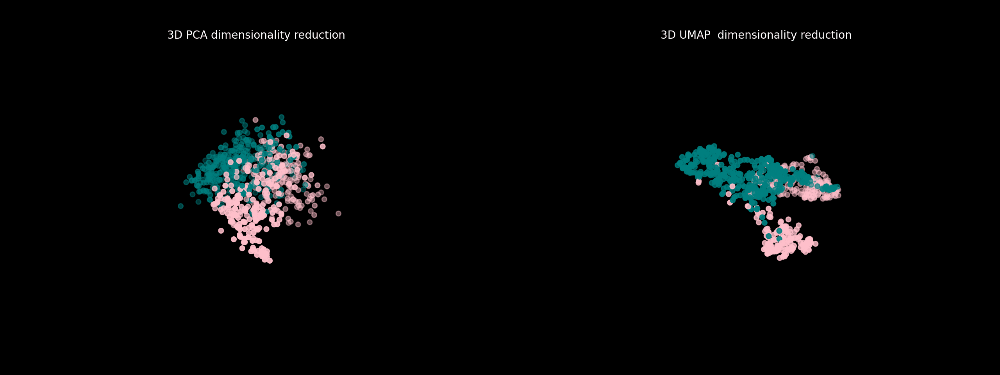

In [ ]:
illustration = illustrate3DFeatures(x_train_f, y_train_d)
illustration.double_gif(animated=True)

### Initiating the Model

In [ ]:
model = mlq.l(svm.SVC)(kernel='linear', C=1)

### Training the Model

In [ ]:
model.fit(x_train_f, y_train_d)

SVC(C=1, kernel='linear')

### Validating the Model

In [ ]:
F1 = metrics.f1_score(y_val_d, model.predict(x_val_f), average='macro').item()
Accuracy = metrics.accuracy_score(y_val_d, model.predict(x_val_f)).item()
mlq.log_metrics(Accuracy, F1)
report = classification_report(y_val_d, model.predict(x_val_f))
print(report)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99        87
           1       0.99      0.99      0.99        98

    accuracy                           0.99       185
   macro avg       0.99      0.99      0.99       185
weighted avg       0.99      0.99      0.99       185



### Tracking

In [ ]:
mlq.end_quest()
mlq.show_logs(quest_name='Deep-SVM', table_dest='../../', last_k=5)

/opt/anaconda3/envs/arm/lib/python3.9/site-packages/mlpath/mlquest/mlquest.py:281: UserWarning: No active mlquest to end
  if mlquest.active == False: warnings.warn('No active mlquest to end')


### Cross Validation

In [ ]:
def CV_Evaluae(model, x_data, y_data, strategy='LOO'):
    """
    Evaluates the performance (F1) of the given model using leave-one-out or repeated KFold cross validation.
    The fact that the function is defined here is a violation to the standards of ths project [Awaiting Fix]
    """
    if strategy == 'LOO':
        cval = LeaveOneOut()
    elif strategy == 'repeated':
        cval = RepeatedKFold(n_splits=20, n_repeats=20, random_state=42)
    f1_scores = []
    for i, j in tqdm(cval.split(x_data)):           # splits yields indecies of the points in the current split
        x_train, x_val = x_data[i], x_data[j]
        y_train, y_val = y_data[i], y_data[j]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_val)
        f1_scores.append(f1_score(y_val, y_pred))

    mean_f1_score = sum(f1_scores) / len(f1_scores)
    return mean_f1_score

# merge x_train_d and x_val_d
x_data_f = np.concatenate((x_train_f, x_val_f), axis=0)
y_data_d = np.concatenate((y_train_d, y_val_d), axis=0)

#### Leave One Out Cross Validation

In [ ]:
F1 = CV_Evaluae(model, x_data_f, y_data_d, strategy='LOO')
print(f"F1 score of Deep-SVM using LOO: {F1}")

400it [00:53,  7.54it/s]

F1 score of Deep-SVM using LOO:  0.9775663906467699


#### Repeated K-Fold Cross Validation

In [ ]:
F1 = CV_Evaluae(model, x_data_f, y_data_d, strategy='repeated')
print(f"F1 score of Deep-SVM using RKF: {F1}")

400it [00:49,  8.08it/s]

F1 score of Deep-SVM using RKF: 0.9775663906467699
